# Project 9- Rainfall Weather Forecasting

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Importing CSV File

In [2]:
df=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv')
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


Observation:

# There are 23 columns in the dataset

Out of which 7 columns are object type

Date column should be split into three parts day,month,year

Many columns are having missing values

There are some duplicate values as well

There are two labels in the dataset - 1. rainfall, 2. rain Tomorrow

There are lot of zero values in rainfall column


In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
df.shape

(8425, 23)

There are 8425 Rows and 23 Columns on the Dataset

In [5]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [6]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

# Checking Null Values

In [8]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

<AxesSubplot:>

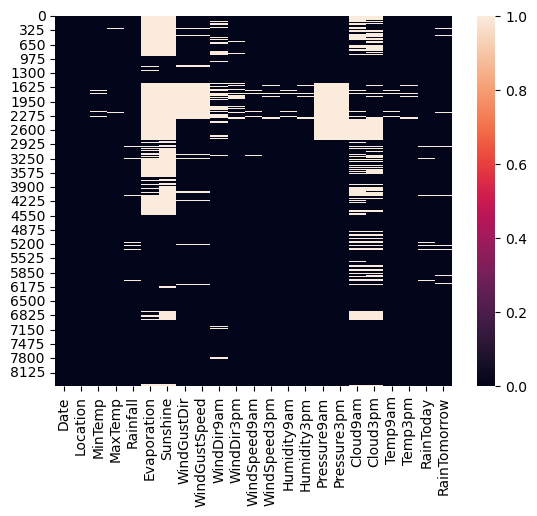

In [9]:
sns.heatmap(df.isnull())

Observation:

As we can see many columns have null values with in them

# Duplicate Values

In [10]:
df.duplicated().sum()

1663

In [11]:
df.drop_duplicates(inplace=True)

In [12]:
df.shape

(6762, 23)

In [13]:
df['Date']=pd.to_datetime(df['Date'])
df['Date_Month']=df['Date'].apply(lambda x:x.month)
df['Date_Day']=df['Date'].apply(lambda x:x.day)
df['Date_Years']=df['Date'].apply(lambda x:x.year)

In [14]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Date_Month,Date_Day,Date_Years
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,1007.1,8.0,NaN,16.9,21.8,No,No,12,1,2008
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,1007.8,NaN,NaN,17.2,24.3,No,No,12,2,2008
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,1008.7,NaN,2.0,21.0,23.2,No,No,12,3,2008
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,1012.8,NaN,NaN,18.1,26.5,No,No,12,4,2008
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,1006.0,7.0,8.0,17.8,29.7,No,No,12,5,2008


In [15]:
df.drop(['Date'],inplace=True,axis=1)
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Date_Month,Date_Day,Date_Years
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,12,1,2008
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,12,2,2008
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,12,3,2008
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,12,4,2008
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,12,5,2008


# Splitting Data into Categorical And Numerical

In [16]:
categorical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_col.append(i)
print('Categorical column:',categorical_col)
print('\n')

numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='float64':
        numerical_col.append(i)
print('Numerical column:',numerical_col)
print('\n')

Categorical column: ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


Numerical column: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']




# Handling Null Values

In [17]:
# Imputating Missing value with mode for categorical features

df['WindGustDir'].fillna(df['WindGustDir'].mode()[0],inplace=True)
df['WindDir9am'].fillna(df['WindDir9am'].mode()[0], inplace=True)
df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0],inplace=True)
df['RainToday'].fillna(df['RainToday'].mode()[0],inplace=True)
df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0],inplace=True)

# Imputation of Numerical features
df['MinTemp'].fillna(df['MinTemp'].median(),inplace=True)
df['MaxTemp'].fillna(df['MaxTemp'].median(), inplace=True)
df['Rainfall'].fillna(df['Rainfall'].median(), inplace=True)
df['Evaporation'].fillna(df['Evaporation'].median(), inplace=True)
df['Sunshine'].fillna(df['Sunshine'].median(), inplace=True)
df['WindGustSpeed'].fillna(df['WindGustSpeed'].median(), inplace=True)
df['WindSpeed9am'].fillna(df['WindSpeed9am'].median(), inplace=True)
df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].median(), inplace=True)
df['Humidity9am'].fillna(df['Humidity9am'].median(), inplace=True)
df['Humidity3pm'].fillna(df['Humidity3pm'].median(), inplace=True)
df['Pressure9am'].fillna(df['Pressure9am'].median(), inplace=True)
df['Pressure3pm'].fillna(df['Pressure3pm'].median(), inplace=True)
df['Cloud9am'].fillna(df['Cloud9am'].median(), inplace=True)
df['Cloud3pm'].fillna(df['Cloud3pm'].median(), inplace=True)
df['Temp9am'].fillna(df['Temp9am'].median(), inplace=True)
df['Temp3pm'].fillna(df['Temp3pm'].median(), inplace=True)

In [18]:
df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Date_Month       0
Date_Day         0
Date_Years       0
dtype: int64

Observation:

1.Missing values in Categorical columns are  imputed with Mode value.

2.Missing Values in Numerical Columns are replaced with Median of repective features.

In [19]:
df.nunique().to_frame('No of unique values')

,No of unique values
Location,12
MinTemp,285
MaxTemp,331
Rainfall,250
Evaporation,116
Sunshine,140
WindGustDir,16
WindGustSpeed,52
WindDir9am,16
WindDir3pm,16


# Statistical Summary

In [21]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,6762.0,13.110086,5.540674,-2.0,9.0,13.2,17.4,28.5
MaxTemp,6762.0,24.093301,6.130367,8.2,19.6,23.5,28.4,45.5
Rainfall,6762.0,2.723410,10.490138,0.0,0.0,0.0,0.8,371.0
Evaporation,6762.0,4.998980,3.361770,0.0,4.0,4.6,5.0,145.0
Sunshine,6762.0,8.421665,2.789228,0.0,8.8,9.0,9.2,13.9
WindGustSpeed,6762.0,38.702159,13.393977,7.0,30.0,37.0,46.0,107.0
WindSpeed9am,6762.0,12.765602,9.789075,0.0,6.0,11.0,19.0,63.0
WindSpeed3pm,6762.0,17.562703,9.548883,0.0,11.0,17.0,24.0,83.0
Humidity9am,6762.0,67.510500,17.182756,10.0,56.0,68.0,80.0,100.0
Humidity3pm,6762.0,50.460515,18.498424,6.0,38.0,50.0,62.0,99.0


Observation:

1. The maximum and the minimum value of Min Temperature in the dataset is 28.5 and -2

2. Similarly the maximum and the mimimum value of the Max Temperature is 45.5 and 8.2

3. The maximum value of Rainfall is 371 while the mimimum value is 0

4. The maximum value of Evaporation And Sunshine is 145 and 13.9 respectively while the mimimum value of both of them is 0

5. The maximum value of Temp at 9am is 39.4 while mimimum is 1.9

6. Similarly the max value of Temp at 3pm is 44.1 while mimimum is 7.3


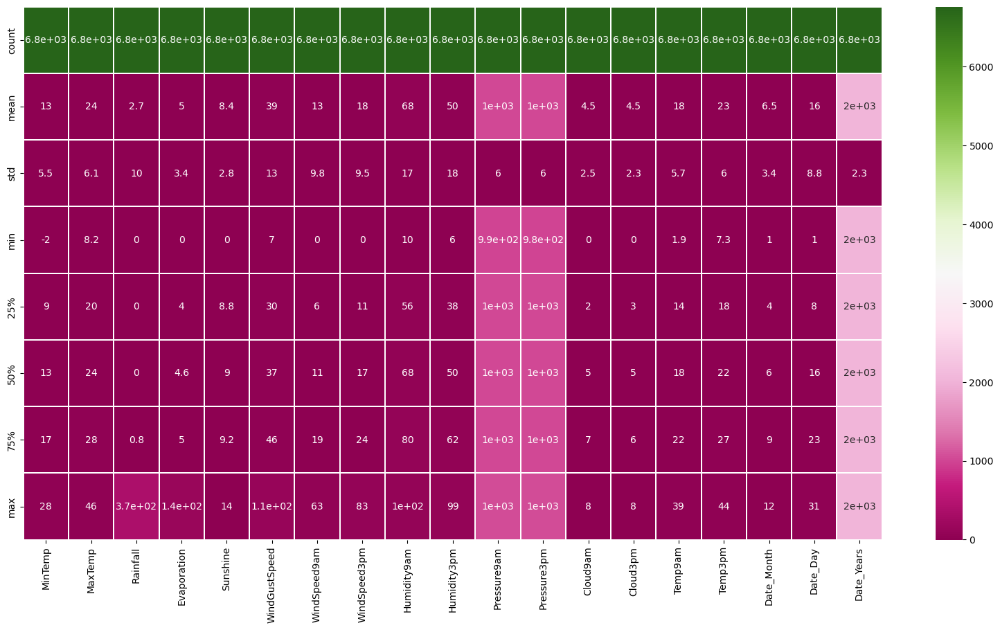

In [22]:
plt.figure(figsize=(20,10))
sns.heatmap(df.describe(),annot=True,cmap='PiYG',linewidth=0.1)
plt.show()

# Exploratory Data Analysis

# Location

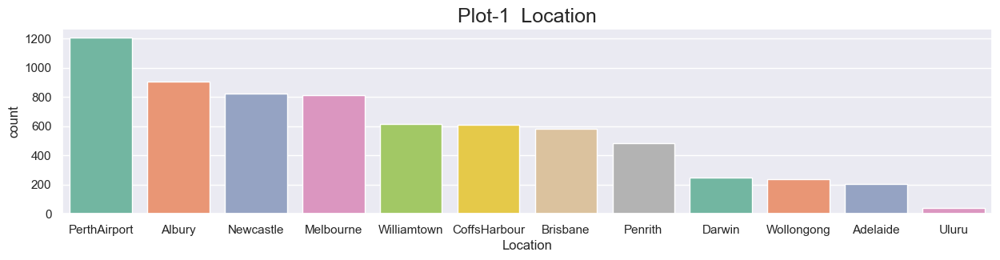

In [24]:
fig = plt.figure(figsize=(15,3))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="Location",palette="Set2", data=df, order = df["Location"].value_counts().index)
plt.title('Plot-1  Location', fontsize=18)
plt.show()

Text(0.5, 1.0, 'Plot2: Location vs Date_Month')

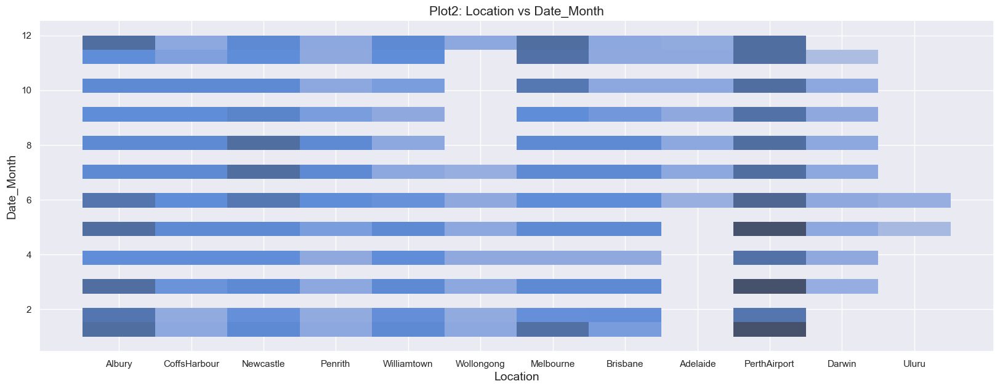

In [25]:
plt.figure(figsize=(20,7))
sns.histplot(y= 'Date_Month',x= 'Location', data=df)
plt.xlabel('Location', fontsize = 14)
plt.ylabel('Date_Month', fontsize = 14)
plt.title('Plot2: Location vs Date_Month', fontsize = 15)

Observation:

In plot1, Count of PerthAirport is higher than others

In relationship bwteeen location and Date_years, in latest years like 2013,2014,2015,2016 the count of locations is decreasing

In plot2, count of perthAirport is higher in 1st,3rd and 5th month

# Min Temp

Text(0.5, 1.0, 'Plot1: MinTemp vs Location')

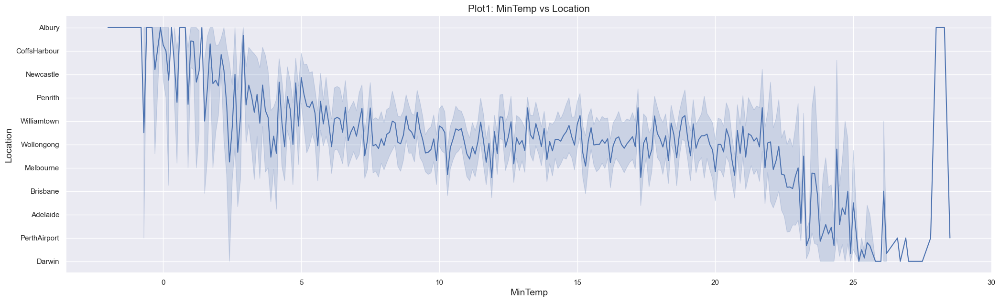

In [26]:
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Location',x= 'MinTemp', data=df)
plt.xlabel('MinTemp', fontsize = 14)
plt.ylabel('Location', fontsize = 14)
plt.title('Plot1: MinTemp vs Location', fontsize = 15)

Observation: The mintemp is low at Albury and it is high at Darwin

# Max Temp

Text(0.5, 1.0, 'Plot1: MaxTemp vs Location')

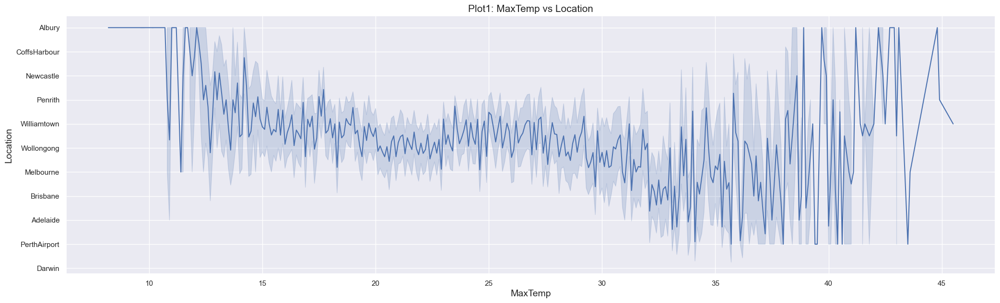

In [27]:
#visualize this column by lineplot
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Location',x= 'MaxTemp', data=df)
plt.xlabel('MaxTemp', fontsize = 14)
plt.ylabel('Location', fontsize = 14)
plt.title('Plot1: MaxTemp vs Location', fontsize = 15)

Observation:  The maxtemp of WillianTown is around above 45deg while the mimimum is 0 of Albury

# Evaporation

Text(0, 0.5, 'Rainfall')

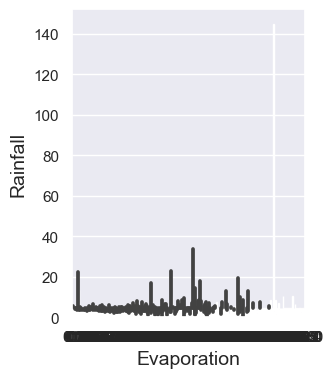

In [28]:
plt.figure(figsize=(3,4))
sns.barplot(y= 'Evaporation',x= 'Rainfall', data=df)
plt.xlabel('Evaporation', fontsize = 14)
plt.ylabel('Rainfall', fontsize = 14)

# Sunshine

Text(0.5, 1.0, 'Plot1: Sunshine vs Location')

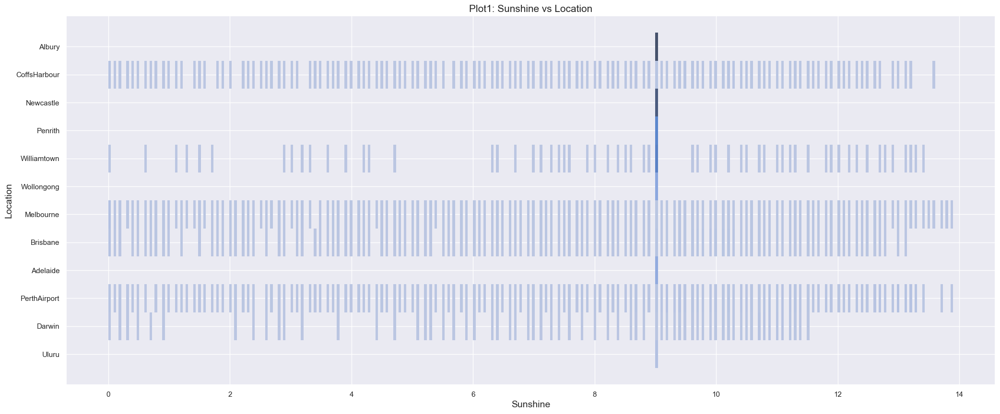

In [29]:
plt.figure(figsize=(25,10))
sns.histplot(y= 'Location',x= 'Sunshine', data=df)
plt.xlabel('Sunshine', fontsize = 14)
plt.ylabel('Location', fontsize = 14)
plt.title('Plot1: Sunshine vs Location', fontsize = 15)

Text(0.5, 1.0, 'Plot2: Sunshine vs MaxTemp')

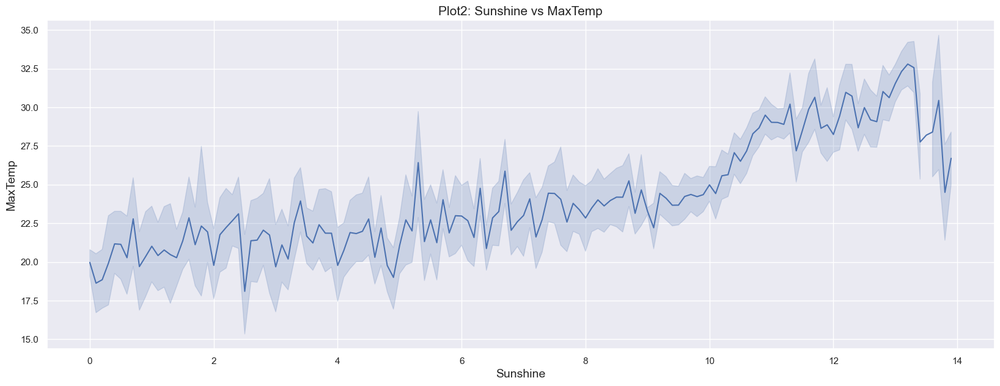

In [31]:
plt.figure(figsize=(20,7))
sns.lineplot(y= 'MaxTemp',x= 'Sunshine', data=df)
plt.xlabel('Sunshine', fontsize = 14)
plt.ylabel('MaxTemp', fontsize = 14)
plt.title('Plot2: Sunshine vs MaxTemp', fontsize = 15)

Observation:

1. Now a days,as the years are increasing, sunshine rate is sligthly increasing

2.In plot1, sunshine rate of perthairport is nearby 13

3.In plot2, maxtemp increases, sunshine rate is increasing

# Wind Gust Speed

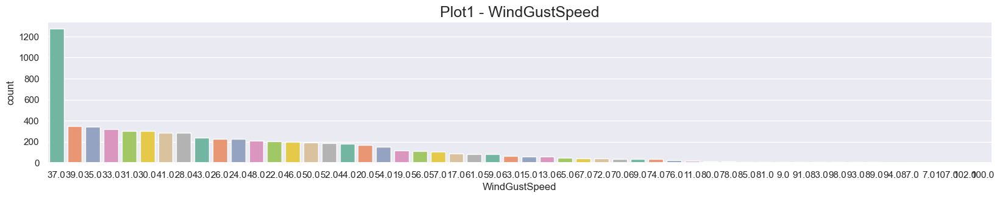

In [32]:
fig = plt.figure(figsize=(20,3))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="WindGustSpeed",palette="Set2", data=df, order = df["WindGustSpeed"].value_counts().index)
plt.title('Plot1 - WindGustSpeed', fontsize=18)
plt.show()

Text(0.5, 1.0, 'Plot2: Location vs WindGustSpeed')

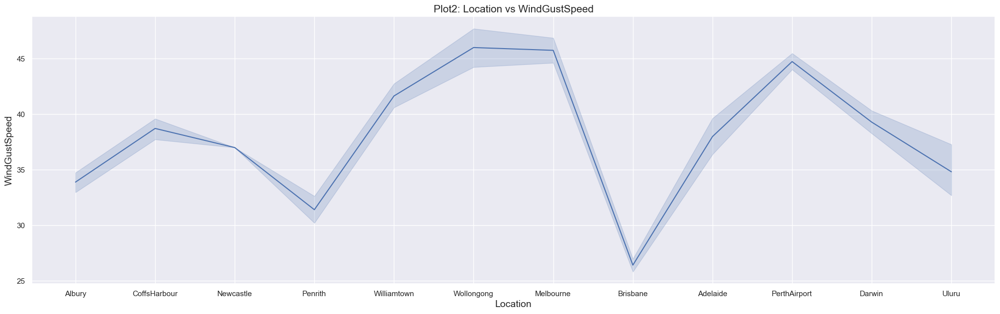

In [33]:
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindGustSpeed',x= 'Location', data=df)
plt.xlabel('Location', fontsize = 14)
plt.ylabel('WindGustSpeed', fontsize = 14)
plt.title('Plot2: Location vs WindGustSpeed', fontsize = 15)

Text(0.5, 1.0, 'Plot3: Rainfall vs WindGustSpeed')

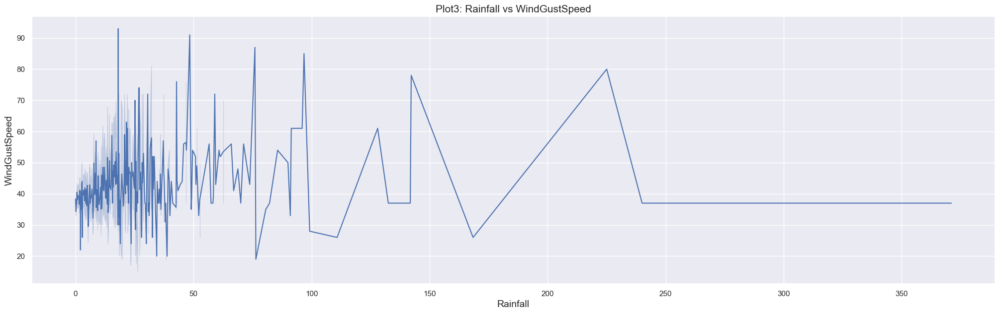

In [36]:
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindGustSpeed',x= 'Rainfall', data=df)
plt.xlabel('Rainfall', fontsize = 14)
plt.ylabel('WindGustSpeed', fontsize = 14)
plt.title('Plot3: Rainfall vs WindGustSpeed', fontsize = 15)

Text(0.5, 1.0, 'Plot4: Sunshine vs WindGustSpeed')

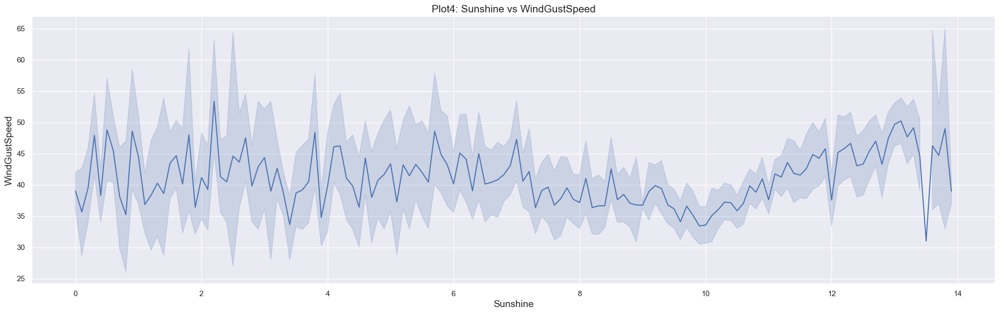

In [37]:
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindGustSpeed',x= 'Sunshine', data=df)
plt.xlabel('Sunshine', fontsize = 14)
plt.ylabel('WindGustSpeed', fontsize = 14)
plt.title('Plot4: Sunshine vs WindGustSpeed', fontsize = 15)

Observation:

In plot1, counts of 37.0 is higher than others

In plot2, brisbane have very low windspeed and  melbourne has very high windspeed

In plot3  windspeed is 40, the mostly rainfall likely to occur

In plot4, as the years are increasing, wind speed is increasing because temperature is increasing


# Wind Speed 9am

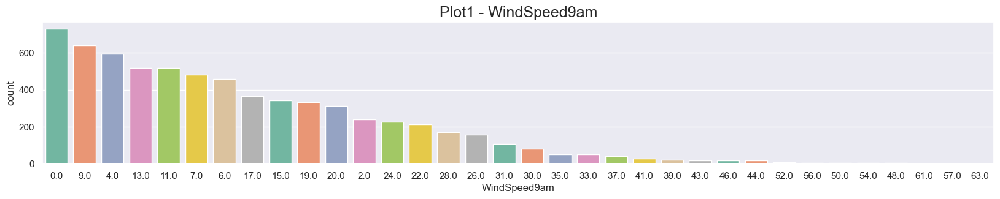

In [38]:
fig = plt.figure(figsize=(20,3))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="WindSpeed9am",palette="Set2", data=df, order = df["WindSpeed9am"].value_counts().index)
plt.title('Plot1 - WindSpeed9am', fontsize=18)
plt.show()

Text(0.5, 1.0, 'Plot2: Location vs WindSpeed9am')

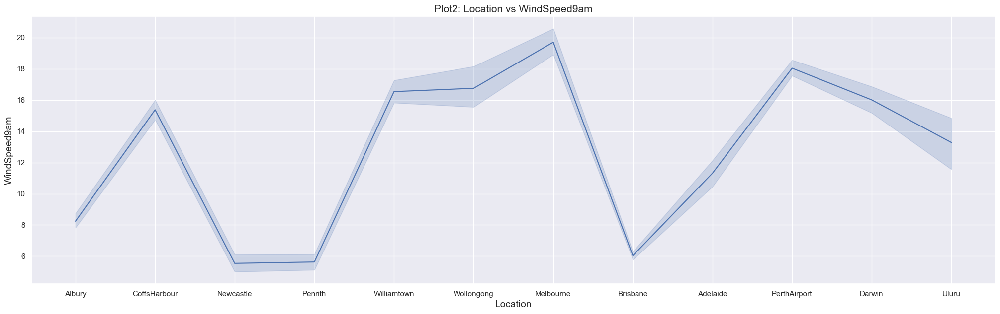

In [39]:
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed9am',x= 'Location', data=df)
plt.xlabel('Location', fontsize = 14)
plt.ylabel('WindSpeed9am', fontsize = 14)
plt.title('Plot2: Location vs WindSpeed9am', fontsize = 15)

Text(0.5, 1.0, 'Plot3: Rainfall vs WindSpeed9am')

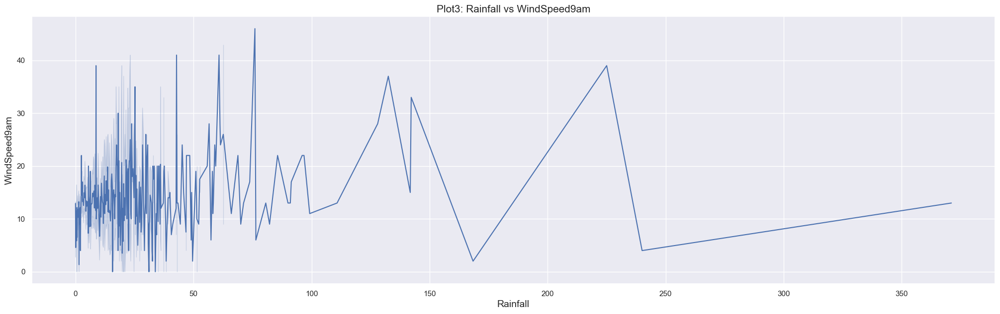

In [40]:
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed9am',x= 'Rainfall', data=df)
plt.xlabel('Rainfall', fontsize = 14)
plt.ylabel('WindSpeed9am', fontsize = 14)
plt.title('Plot3: Rainfall vs WindSpeed9am', fontsize = 15)

Observation:

In plot1, counts of 0 is highest than others then followed by 9

In plot2, penirth and newcastle have very low windspeed and  melbourne has very high windspeed

In plot3  Rainfall is more as the windspeed is moderate

# Wind Speed 3pm

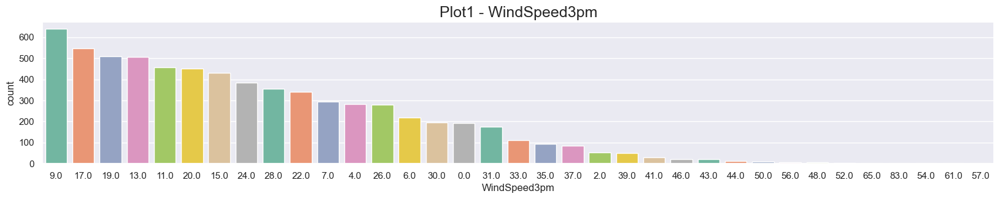

In [41]:
fig = plt.figure(figsize=(20,3))
sns.set_theme(style="darkgrid")
ax = sns.countplot(x="WindSpeed3pm",palette="Set2", data=df, order = df["WindSpeed3pm"].value_counts().index)
plt.title('Plot1 - WindSpeed3pm', fontsize=18)
plt.show()

Text(0.5, 1.0, 'Plot2: Location vs WindSpeed3pm')

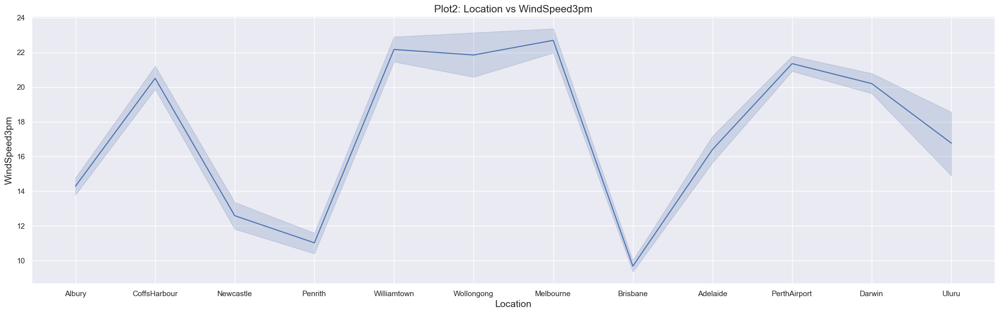

In [42]:
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed3pm',x= 'Location', data=df)
plt.xlabel('Location', fontsize = 14)
plt.ylabel('WindSpeed3pm', fontsize = 14)
plt.title('Plot2: Location vs WindSpeed3pm', fontsize = 15)

Text(0.5, 1.0, 'Plot3: Rainfall vs WindSpeed3pm')

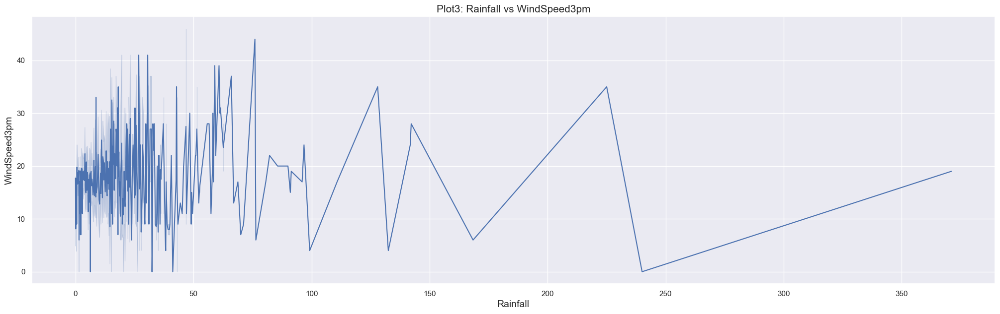

In [43]:
plt.figure(figsize=(25,7))
sns.lineplot(y= 'WindSpeed3pm',x= 'Rainfall', data=df)
plt.xlabel('Rainfall', fontsize = 14)
plt.ylabel('WindSpeed3pm', fontsize = 14)
plt.title('Plot3: Rainfall vs WindSpeed3pm', fontsize = 15)

Observation:

In plot1, counts of 9 is highest than others 

In plot2, penirth and brisbane have very low windspeed and melbourne has very high windspeed

In plot3 Rainfall is more as the windspeed is moderate

# Humidity9am

Text(0.5, 1.0, ' Rainfall vs Humidity9am')

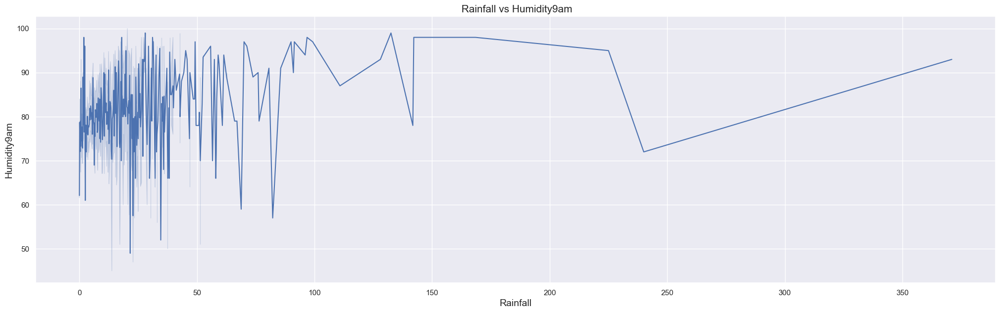

In [46]:
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity9am',x= 'Rainfall', data=df)
plt.xlabel('Rainfall', fontsize = 14)
plt.ylabel('Humidity9am', fontsize = 14)
plt.title(' Rainfall vs Humidity9am', fontsize = 15)

# Humidity3pm

Text(0.5, 1.0, ' Rainfall vs Humidity3pm')

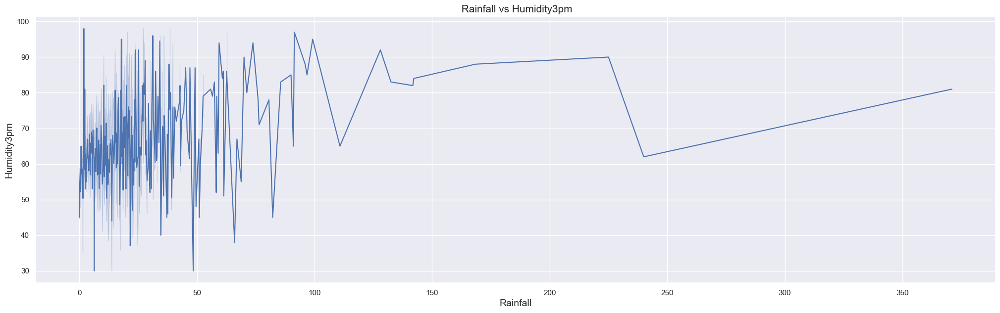

In [47]:
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Humidity3pm',x= 'Rainfall', data=df)
plt.xlabel('Rainfall', fontsize = 14)
plt.ylabel('Humidity3pm', fontsize = 14)
plt.title(' Rainfall vs Humidity3pm', fontsize = 15)

# Pressure9am

Text(0.5, 1.0, ' Rainfall vs Pressure9am')

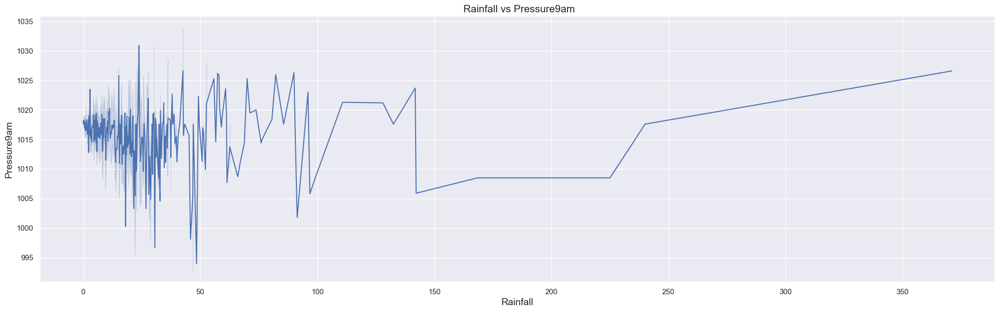

In [48]:
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure9am',x= 'Rainfall', data=df)
plt.xlabel('Rainfall', fontsize = 14)
plt.ylabel('Pressure9am', fontsize = 14)
plt.title(' Rainfall vs Pressure9am', fontsize = 15)

# Pressure3pm

Text(0.5, 1.0, ' Rainfall vs Pressure3pm')

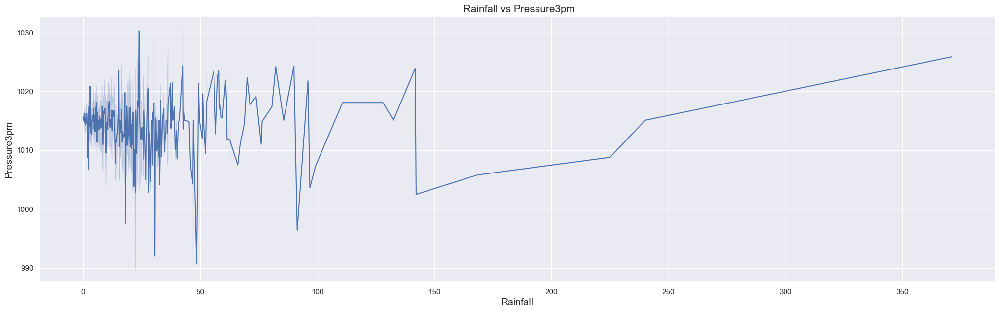

In [49]:
plt.figure(figsize=(25,7))
sns.lineplot(y= 'Pressure3pm',x= 'Rainfall', data=df)
plt.xlabel('Rainfall', fontsize = 14)
plt.ylabel('Pressure3pm', fontsize = 14)
plt.title(' Rainfall vs Pressure3pm', fontsize = 15)

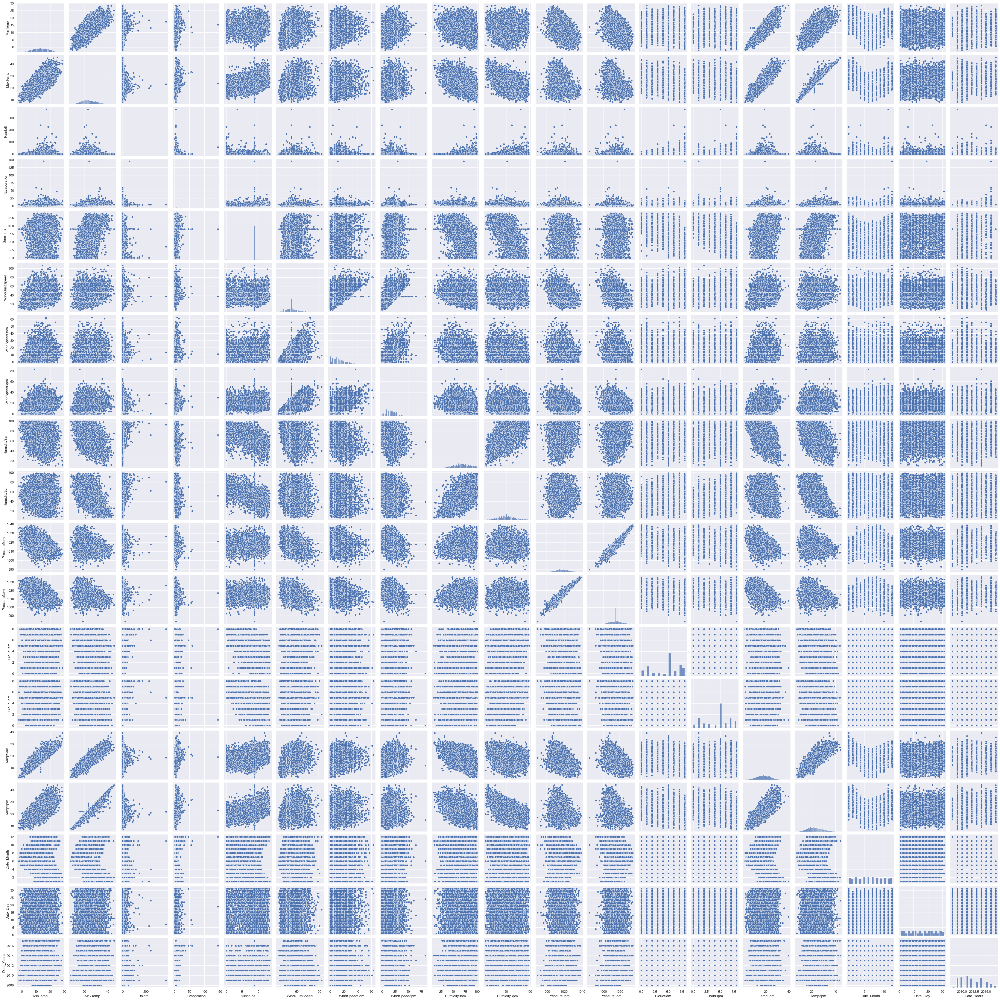

In [50]:
sns.pairplot(data=df)

# Encoding Categorical Column

In [51]:
from sklearn.preprocessing import LabelEncoder

In [52]:
le=LabelEncoder()
for i in categorical_col:
    df[i]=le.fit_transform(df[i])
df.head(5)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Date_Month,Date_Day,Date_Years
0,1,13.4,22.9,0.6,4.6,9.0,13,44.0,13,14,...,1007.1,8.0,5.0,16.9,21.8,0,0,12,1,2008
1,1,7.4,25.1,0.0,4.6,9.0,14,44.0,6,15,...,1007.8,5.0,5.0,17.2,24.3,0,0,12,2,2008
2,1,12.9,25.7,0.0,4.6,9.0,15,46.0,13,15,...,1008.7,5.0,2.0,21.0,23.2,0,0,12,3,2008
3,1,9.2,28.0,0.0,4.6,9.0,4,24.0,9,0,...,1012.8,5.0,5.0,18.1,26.5,0,0,12,4,2008
4,1,17.5,32.3,1.0,4.6,9.0,13,41.0,1,7,...,1006.0,7.0,8.0,17.8,29.7,0,0,12,5,2008


# Outliers Detection and Removal

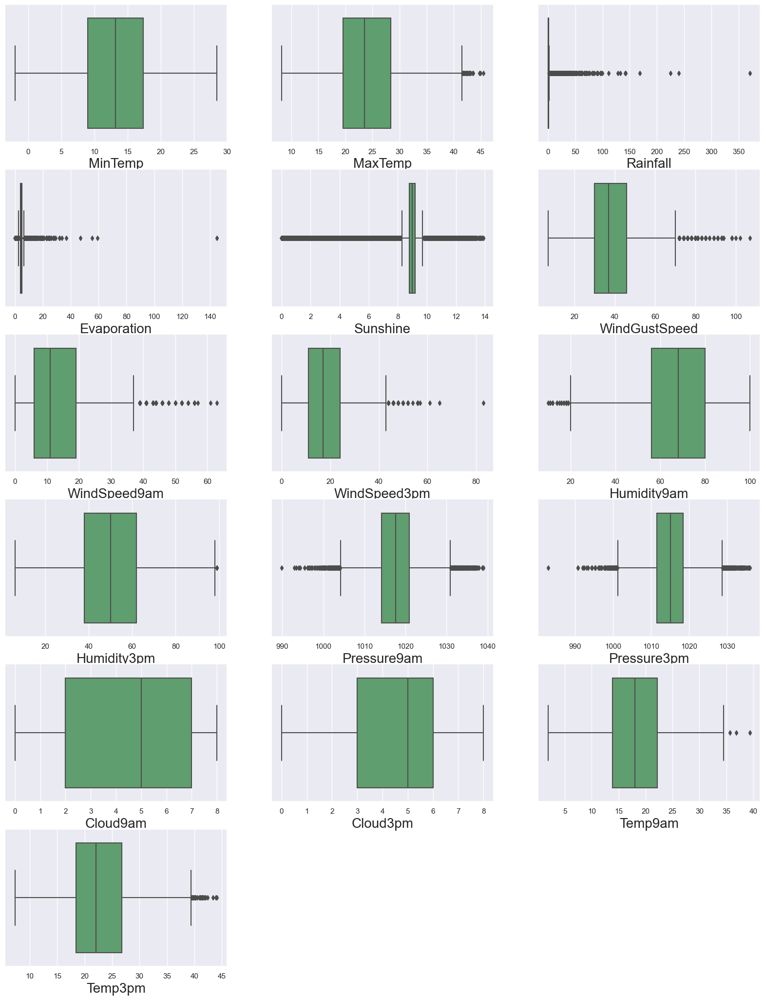

In [54]:
plt.figure(figsize=(20,30),facecolor='white')
p=1

for column in numerical_col:
    if p<=21:
        ax=plt.subplot(7,3,p)
        sns.boxplot(df[column],color='g')
        plt.xlabel(column,fontsize=20)
    p+=1
plt.show()

Observation: From Boxplot we came to know that the outliers exists in the dataset

# Outliers Removal Through zsore

In [55]:
from scipy.stats import zscore

In [56]:
z = np.abs(zscore(df))
threshold = 3
df1 = df[(z<3).all(axis = 1)]

print ("Shape of the dataframe before removing outliers: ", df.shape)
print ("Shape of the dataframe after removing outliers: ", df1.shape)
print ("Percentage of data loss post outlier removal: ", (df.shape[0]-df1.shape[0])/df.shape[0]*100)

df=df1.copy()

Shape of the dataframe before removing outliers:  (6762, 25)
Shape of the dataframe after removing outliers:  (6305, 25)
Percentage of data loss post outlier removal:  6.758355516119491


# Skewness

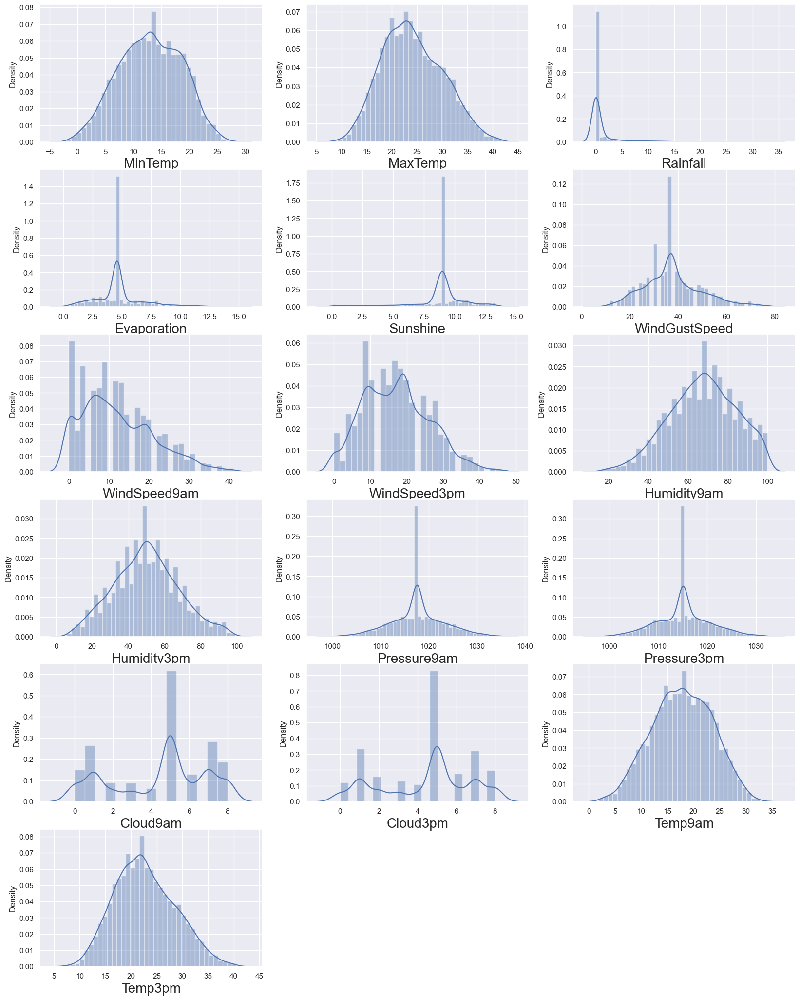

In [57]:
plt.figure(figsize=(20,30),facecolor='white')

p=1
for col in numerical_col:
    if p<=21:
        plt.subplot(7,3,p)
        sns.distplot(df[col])
        plt.xlabel(col,fontsize=20)
    p+=1
plt.show()

In [58]:
df.skew()

Location        -0.005041
MinTemp         -0.073640
MaxTemp          0.263690
Rainfall         3.572436
Evaporation      1.136753
Sunshine        -1.358828
WindGustDir      0.109246
WindGustSpeed    0.544830
WindDir9am       0.214975
WindDir3pm      -0.128511
WindSpeed9am     0.680216
WindSpeed3pm     0.342765
Humidity9am     -0.224837
Humidity3pm      0.139294
Pressure9am      0.067423
Pressure3pm      0.088337
Cloud9am        -0.400423
Cloud3pm        -0.370944
Temp9am         -0.075437
Temp3pm          0.288331
RainToday        1.371384
RainTomorrow     1.383878
Date_Month       0.030646
Date_Day         0.005324
Date_Years       0.338266
dtype: float64

# Removing skewness

In [59]:
from sklearn.preprocessing import PowerTransformer

In [60]:
skew=['Sunshine']
scaler = PowerTransformer(method='yeo-johnson')
df[skew] = scaler.fit_transform(df[skew].values)

In [62]:
df[skew].skew()

Sunshine   -0.097213
dtype: float64

Observation:  In categoriacl columns there is no means of skewness so we are going to leave it.
    
              And rest data will be skewed automatically at the end. 

# Correlation

In [63]:
df.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Date_Month,Date_Day,Date_Years
Location,1.000000,0.095996,0.072443,0.017224,0.124576,0.063435,-0.086156,0.267144,-0.100510,0.002253,...,-0.017165,-0.008862,-0.009485,0.100788,0.068299,0.002484,0.007519,-0.072855,-0.003702,0.504933
MinTemp,0.095996,1.000000,0.737725,0.086260,0.396662,0.078864,-0.143145,0.250261,-0.020086,-0.142837,...,-0.446904,0.064567,0.009420,0.894306,0.707385,0.062919,0.081773,-0.234035,0.017074,0.035303
MaxTemp,0.072443,0.737725,1.000000,-0.141079,0.490642,0.361519,-0.200268,0.172636,-0.192361,-0.166038,...,-0.426260,-0.236135,-0.237181,0.867114,0.975030,-0.219639,-0.154579,-0.172085,0.018575,0.077777
Rainfall,0.017224,0.086260,-0.141079,1.000000,-0.103523,-0.166957,0.073570,0.097873,0.121385,0.079713,...,-0.050963,0.215248,0.171380,-0.038107,-0.150520,0.703806,0.261425,-0.000151,-0.010499,0.004645
Evaporation,0.124576,0.396662,0.490642,-0.103523,1.000000,0.461160,-0.114629,0.245531,-0.123836,-0.026510,...,-0.308136,-0.143698,-0.186961,0.465315,0.477604,-0.178280,-0.106566,-0.053000,0.006279,0.071610
Sunshine,0.063435,0.078864,0.361519,-0.166957,0.461160,1.000000,-0.118332,0.045880,-0.108610,-0.056305,...,-0.110815,-0.500888,-0.529463,0.258859,0.380701,-0.222425,-0.299436,-0.003987,-0.000244,0.068432
WindGustDir,-0.086156,-0.143145,-0.200268,0.073570,-0.114629,-0.118332,1.000000,0.028487,0.379358,0.454594,...,-0.010275,0.130933,0.089165,-0.157459,-0.210470,0.113372,0.035527,0.032727,0.017805,-0.184194
WindGustSpeed,0.267144,0.250261,0.172636,0.097873,0.245531,0.045880,0.028487,1.000000,-0.057432,0.095597,...,-0.328287,-0.008196,0.022572,0.228653,0.140525,0.082752,0.170834,0.047239,-0.002348,-0.033696
WindDir9am,-0.100510,-0.020086,-0.192361,0.121385,-0.123836,-0.108610,0.379358,-0.057432,1.000000,0.202162,...,0.051519,0.068703,0.052061,-0.065657,-0.201210,0.151341,0.034833,0.019081,-0.004047,-0.081273
WindDir3pm,0.002253,-0.142837,-0.166038,0.079713,-0.026510,-0.056305,0.454594,0.095597,0.202162,1.000000,...,-0.045148,0.078159,0.056722,-0.149852,-0.177815,0.101941,0.002626,0.029038,0.002267,0.007258


<AxesSubplot:>

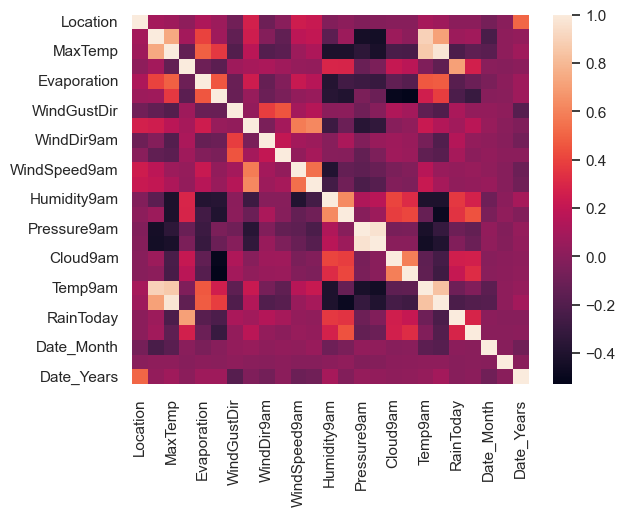

In [64]:
sns.heatmap(df.corr())

# Scaling Of Data

In [65]:
#split x and y
x = df.drop(['Rainfall'], axis=1)
y=df['Rainfall']

In [67]:
from sklearn.preprocessing import StandardScaler

In [68]:
#scale the features
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_scaled

array([[-1.39081955,  0.07696121, -0.20077769, ...,  1.65399403,
        -1.67189736, -1.77104181],
       [-1.39081955, -1.00548016,  0.16475898, ...,  1.65399403,
        -1.55812541, -1.77104181],
       [-1.39081955, -0.01324224,  0.2644508 , ...,  1.65399403,
        -1.44435346, -1.77104181],
       ...,
       [ 1.19498723, -1.36629394,  0.46383444, ..., -0.13598749,
         0.83108563,  2.15373237],
       [ 1.19498723, -0.9333174 ,  0.48044975, ..., -0.13598749,
         0.94485758,  2.15373237],
       [ 1.19498723,  0.34757155, -0.10108587, ..., -0.13598749,
         1.05862954,  2.15373237]])

# Multicollinearity

# VIF

In [69]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [70]:
vif =pd.DataFrame()
vif['vif'] = [variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
vif['Features'] = x.columns
vif

,vif,Features
0,4.577375,Location
1,59.720025,MinTemp
2,452.243480,MaxTemp
3,10.405304,Evaporation
4,1.991662,Sunshine
5,3.925691,WindGustDir
6,25.048437,WindGustSpeed
7,4.502023,WindDir9am
8,5.749460,WindDir3pm
9,5.807925,WindSpeed9am


Observation:

Removing Some of highly correlated features. But this will not work here as most of input features are correlated with each other either moderated or poorly.

# Modelling Of Data for Rainfall

In [74]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor

In [75]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=42, test_size=.33)
print('Training feature matrix size:',x_train.shape)
print('Training target vector size:',y_train.shape)
print('Test feature matrix size:',x_test.shape)
print('Test target vector size:',y_test.shape)

Training feature matrix size: (4224, 24)
Training target vector size: (4224,)
Test feature matrix size: (2081, 24)
Test target vector size: (2081,)


In [76]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
maxR2_score=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.33, random_state=i)
    lin_reg=LinearRegression()
    lin_reg.fit(x_train,y_train)
    y_pred=lin_reg.predict(x_test)
    R2=r2_score(y_test,y_pred)
    if R2>maxR2_score:
        maxR2_score=R2
        maxRS=i
print('Best accuracy is', maxR2_score ,'on Random_state', maxRS)

Best accuracy is 0.5404409356369706 on Random_state 176


# Linear Regression

In [77]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.33, random_state=148)
lin_reg=LinearRegression()
lin_reg.fit(x_train,y_train)
lin_reg.score(x_train,y_train)
y_pred=lin_reg.predict(x_test)
print('Mean absolute error :', mean_absolute_error(y_test,y_pred))
print('Mean squared error :', mean_squared_error(y_test,y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test,y_pred)))
print('\n')
from sklearn.metrics import r2_score

print('R2 score is:',r2_score(y_test,y_pred))

Mean absolute error : 1.4459415771018895
Mean squared error : 9.922577420220566
Root Mean Squared Error: 3.1500122888999282


R2 score is: 0.5201978026284586


# Other Ml Models

In [79]:
from sklearn.linear_model import Ridge, Lasso

In [81]:
model=[ AdaBoostRegressor(),
        SVR(),
        DecisionTreeRegressor(),
        RandomForestRegressor(),
        Ridge(),
        Lasso()]
for m in model:
    m.fit(x_train,y_train)
    y_pred=m.predict(x_test)
    print('Classification ML Algorithm Evaluation Matrix',m,'is' )
    print('\n')
    print('Mean absolute error :', mean_absolute_error(y_test,y_pred))
    print('\n')
    print('Mean squared error :', mean_squared_error(y_test,y_pred))
    print('\n')
    print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test,y_pred)))
    print('\n')
    print('R2 score is:',r2_score(y_test,y_pred))
    print('\n')    

Classification ML Algorithm Evaluation Matrix AdaBoostRegressor() is


Mean absolute error : 1.4105816838491103


Mean squared error : 11.603969330670536


Root Mean Squared Error: 3.406459941151596


R2 score is: 0.4388947803277572


Classification ML Algorithm Evaluation Matrix SVR() is


Mean absolute error : 1.8083062669187315


Mean squared error : 23.393361621520718


Root Mean Squared Error: 4.836668442380635


R2 score is: -0.1311764912047646


Classification ML Algorithm Evaluation Matrix DecisionTreeRegressor() is


Mean absolute error : 1.638395002402691


Mean squared error : 21.538572801537725


Root Mean Squared Error: 4.640966795996038


R2 score is: -0.041488931833902454


Classification ML Algorithm Evaluation Matrix RandomForestRegressor() is


Mean absolute error : 1.2023978856319077


Mean squared error : 9.604826600672753


Root Mean Squared Error: 3.099165468424162


R2 score is: 0.535562514333803


Classification ML Algorithm Evaluation Matrix Ridge() is


Mean a

# Cross Val Score

In [82]:
from sklearn.model_selection import cross_val_score

In [83]:
model=[ AdaBoostRegressor(),
        LinearRegression(),
        SVR(),
        Ridge(),
        DecisionTreeRegressor(),
        Lasso(),
        RandomForestRegressor()]
        

for m in model:
    score = cross_val_score(m, x, y, cv =5)
    print('\n')
    print('Cross Validation Score', m,)
    print("Score :" ,score)
    print("Mean Score :",score.mean())
    print("Std deviation :",score.std())
    print('\n')



Cross Validation Score AdaBoostRegressor()
Score : [0.35164405 0.4489117  0.35914428 0.41093398 0.50746272]
Mean Score : 0.4156193462962997
Std deviation : 0.058047928986177895




Cross Validation Score LinearRegression()
Score : [0.50573619 0.49045978 0.47786741 0.47771844 0.5305981 ]
Mean Score : 0.49647598642627333
Std deviation : 0.01992179521781827




Cross Validation Score SVR()
Score : [-0.12597017 -0.14446599 -0.13074768 -0.10950851 -0.10238531]
Mean Score : -0.12261553306225377
Std deviation : 0.015072384552848445




Cross Validation Score Ridge()
Score : [0.50583345 0.49037105 0.47788505 0.47771485 0.53050804]
Mean Score : 0.4964624897620521
Std deviation : 0.019902841504063986




Cross Validation Score DecisionTreeRegressor()
Score : [ 0.08129746  0.02143063 -0.23513496  0.15672639 -0.19524768]
Mean Score : -0.034185633713983046
Std deviation : 0.15440112052556848




Cross Validation Score Lasso()
Score : [0.21384133 0.12498686 0.09479116 0.14330246 0.22906956]
Mean S

# We came to know that Random Forest Regressor has highest R2 score

# Grid Search CV

In [84]:
from sklearn.model_selection import GridSearchCV 

In [85]:
parameter = {'n_estimators':[30,60,80],'max_depth': [10,20,40],
             'min_samples_leaf':[5,10],'criterion':['mse','mae'],
             'max_features':["auto","sqrt","log2"]}

In [86]:
GCV = GridSearchCV(RandomForestRegressor(),parameter,cv=5,n_jobs = -1,verbose = 3)

In [87]:
GCV.fit(x_train,y_train)

Fitting 5 folds for each of 108 candidates, totalling 540 fits


GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'criterion': ['mse', 'mae'], 'max_depth': [10, 20, 40],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [5, 10],
                         'n_estimators': [30, 60, 80]},
             verbose=3)

In [88]:
GCV.best_params_ 

{'criterion': 'mse',
 'max_depth': 20,
 'max_features': 'auto',
 'min_samples_leaf': 10,
 'n_estimators': 60}

# Final Model

In [90]:
Model =  RandomForestRegressor(n_estimators=60 ,criterion = 'mse', max_depth= 20, max_features = 'auto',
             min_samples_leaf = 10)
Model.fit(x_train,y_train)
y_pred=Model.predict(x_test)
print('\n')                  
print(' R2 Score of Final Model:')
print(r2_score(y_test,y_pred)) 
print('\n')



 R2 Score of Final Model:
0.5504755453270348




# Saving Model

In [91]:
import joblib
import pickle

In [92]:
filename="Rainfall Weather forecast.pkl"
pickle.dump(Model,open(filename,'wb'))

# Now Taking Rainfall Tomorrow

In [93]:
df.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Date_Month', 'Date_Day',
       'Date_Years'],
      dtype='object')

# Scaling Of Data

In [94]:
#split x and y
x = df.drop(['RainTomorrow'], axis=1)
y=df['RainTomorrow']

In [96]:
scaler=StandardScaler()
x_scaled=scaler.fit_transform(x)
x_scaled


array([[-1.39081955,  0.07696121, -0.20077769, ...,  1.65399403,
        -1.67189736, -1.77104181],
       [-1.39081955, -1.00548016,  0.16475898, ...,  1.65399403,
        -1.55812541, -1.77104181],
       [-1.39081955, -0.01324224,  0.2644508 , ...,  1.65399403,
        -1.44435346, -1.77104181],
       ...,
       [ 1.19498723, -1.36629394,  0.46383444, ..., -0.13598749,
         0.83108563,  2.15373237],
       [ 1.19498723, -0.9333174 ,  0.48044975, ..., -0.13598749,
         0.94485758,  2.15373237],
       [ 1.19498723,  0.34757155, -0.10108587, ..., -0.13598749,
         1.05862954,  2.15373237]])

# Multicollinearity

# VIF

In [97]:
vif =pd.DataFrame()
vif['vif'] = [variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
vif['Features'] = x.columns
vif

,vif,Features
0,4.567488,Location
1,59.668354,MinTemp
2,451.965507,MaxTemp
3,2.316205,Rainfall
4,10.406326,Evaporation
5,1.971393,Sunshine
6,3.922653,WindGustDir
7,24.194710,WindGustSpeed
8,4.506076,WindDir9am
9,5.744801,WindDir3pm


# Modelling Of Data For Rain Tomorrow

In [98]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,f1_score

In [99]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=42, test_size=.33)
print('Training feature matrix size:',x_train.shape)
print('Training target vector size:',y_train.shape)
print('Test feature matrix size:',x_test.shape)
print('Test target vector size:',y_test.shape)

Training feature matrix size: (4224, 24)
Training target vector size: (4224,)
Test feature matrix size: (2081, 24)
Test target vector size: (2081,)


In [100]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,f1_score
maxAccu=0
maxRS=0
for i in range(1,250):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.33, random_state=i)
    log_reg=LogisticRegression()
    log_reg.fit(x_train,y_train)
    y_pred=log_reg.predict(x_test)
    acc=accuracy_score(y_test,y_pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('Best accuracy is', maxAccu ,'on Random_state', maxRS)

Best accuracy is 0.8563190773666507 on Random_state 57


# Logistic Regression

In [101]:
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state=42, test_size=.33)
log_reg=LogisticRegression()
log_reg.fit(x_train,y_train)
y_pred=log_reg.predict(x_test)

print('Accuracy Score of Logistics Regression :', accuracy_score(y_test, y_pred))
print('\n')
print('Confusion matrix of Logistics Regression :',confusion_matrix(y_test, y_pred))
print('\n')
print('classification Report of Logistics Regression',classification_report(y_test, y_pred))

Accuracy Score of Logistics Regression : 0.8399807784718886


Confusion matrix of Logistics Regression : [[1543  101]
 [ 232  205]]


classification Report of Logistics Regression               precision    recall  f1-score   support

           0       0.87      0.94      0.90      1644
           1       0.67      0.47      0.55       437

    accuracy                           0.84      2081
   macro avg       0.77      0.70      0.73      2081
weighted avg       0.83      0.84      0.83      2081



# Other ML Models

In [102]:
model=[ AdaBoostClassifier(),
        SVC(),
        GaussianNB(),
        DecisionTreeClassifier(),
        KNeighborsClassifier(n_neighbors = 3),
        RandomForestClassifier(),
        ExtraTreesClassifier(),
        GradientBoostingClassifier()]
        
for m in model:
    m.fit(x_train,y_train)
    y_pred=m.predict(x_test)
    print('Classification ML Algorithm Evaluation Matrix',m,'is' )
    print('\n')
    print('Accuracy Score :', accuracy_score(y_test, y_pred))
    print('\n')
    print('Confusion matrix :',confusion_matrix(y_test, y_pred))
    print('\n')
    print('Classification Report :',classification_report(y_test, y_pred))
    print('\n')

Classification ML Algorithm Evaluation Matrix AdaBoostClassifier() is


Accuracy Score : 0.8438250840941854


Confusion matrix : [[1543  101]
 [ 224  213]]


Classification Report :               precision    recall  f1-score   support

           0       0.87      0.94      0.90      1644
           1       0.68      0.49      0.57       437

    accuracy                           0.84      2081
   macro avg       0.78      0.71      0.74      2081
weighted avg       0.83      0.84      0.83      2081



Classification ML Algorithm Evaluation Matrix SVC() is


Accuracy Score : 0.7900048053820279


Confusion matrix : [[1644    0]
 [ 437    0]]


Classification Report :               precision    recall  f1-score   support

           0       0.79      1.00      0.88      1644
           1       0.00      0.00      0.00       437

    accuracy                           0.79      2081
   macro avg       0.40      0.50      0.44      2081
weighted avg       0.62      0.79      0.70      2

# Cross Val Score

In [103]:
model=[ AdaBoostClassifier(),
        LogisticRegression(),
        SVC(),
        GaussianNB(),
        DecisionTreeClassifier(),
        KNeighborsClassifier(n_neighbors = 3),
        RandomForestClassifier(),
        ExtraTreesClassifier(),
        GradientBoostingClassifier()]

for m in model:
    score = cross_val_score(m, x, y, cv =5)
    print('\n')
    print('Cross Validation Score', m,)
    print("Score :" ,score)
    print("Mean Score :",score.mean())
    print("Std deviation :",score.std())
    print('\n')



Cross Validation Score AdaBoostClassifier()
Score : [0.84773989 0.79698652 0.75574941 0.71371927 0.83425852]
Mean Score : 0.7896907216494846
Std deviation : 0.049664671420835756




Cross Validation Score LogisticRegression()
Score : [0.8628073  0.80491673 0.77557494 0.84615385 0.84694687]
Mean Score : 0.8272799365582871
Std deviation : 0.032182993622706726




Cross Validation Score SVC()
Score : [0.7850912  0.78429818 0.78429818 0.78429818 0.78429818]
Mean Score : 0.784456780333069
Std deviation : 0.0003172085646312439




Cross Validation Score GaussianNB()
Score : [0.79381443 0.77557494 0.70816812 0.79777954 0.85408406]
Mean Score : 0.7858842188739096
Std deviation : 0.04690773601148994




Cross Validation Score DecisionTreeClassifier()
Score : [0.74781919 0.60111023 0.66613799 0.68596352 0.78429818]
Mean Score : 0.697065820777161
Std deviation : 0.06398852374370201




Cross Validation Score KNeighborsClassifier(n_neighbors=3)
Score : [0.82315623 0.77002379 0.73671689 0.8136399

# We came to know that Random Forest Classifier has Highest accuracy among all Models

# Hyper Parameter Tuning- Grid Search CV

In [104]:
parameter = {  'bootstrap': [True], 'max_depth': [5, 10,20,40,50, None], 
              'max_features': ['auto', 'log2'], 
              'criterion':['gini','entropy'],
              'n_estimators': [5, 10, 15 ,25,50,100]}

In [106]:
GCV = GridSearchCV(RandomForestClassifier(),parameter,cv=5,n_jobs = -1,verbose=3)
GCV.fit(x_train,y_train)

Fitting 5 folds for each of 144 candidates, totalling 720 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'bootstrap': [True], 'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 10, 20, 40, 50, None],
                         'max_features': ['auto', 'log2'],
                         'n_estimators': [5, 10, 15, 25, 50, 100]},
             verbose=3)

In [107]:
GCV.best_params_

{'bootstrap': True,
 'criterion': 'gini',
 'max_depth': 20,
 'max_features': 'log2',
 'n_estimators': 100}

# Final Model

In [108]:
Model=RandomForestClassifier(bootstrap=True,criterion='gini',n_estimators= 100, max_depth=20 ,max_features='log2')
Model.fit(x_train,y_train)

print('Accuracy Score :', accuracy_score(y_test, y_pred))

Accuracy Score : 0.8481499279192696


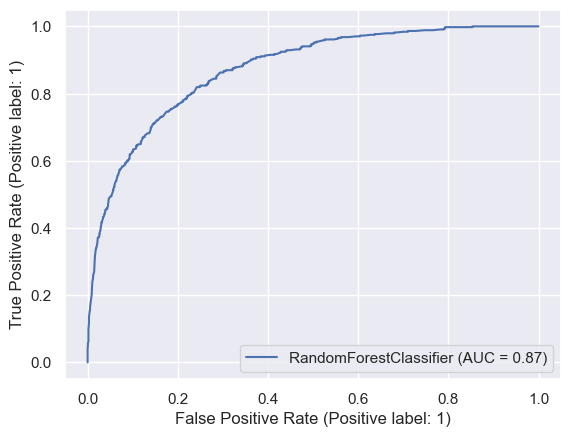

<Figure size 1000x1000 with 0 Axes>

Auc Score : 0.7109035282589209


In [109]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import plot_roc_curve
disp = plot_roc_curve(Model,x_test,y_test)   
plt.legend(prop={'size':11}, loc='lower right')
plt.figure(figsize=(10,10))
plt.show()
plt.show()
auc_score = roc_auc_score(y_test, Model.predict(x_test))
print('Auc Score :',auc_score)

# Saving Model

In [110]:
import joblib
import pickle

In [111]:
filename='Rainfall Tomorrow weather forecast.pkl'
pickle.dump(Model,open(filename,'wb'))